## Causal vs non-Causal

In [1]:
!pip install -U denoiser

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.8/49.8 kB 1.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.1/72.1 kB 6.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64

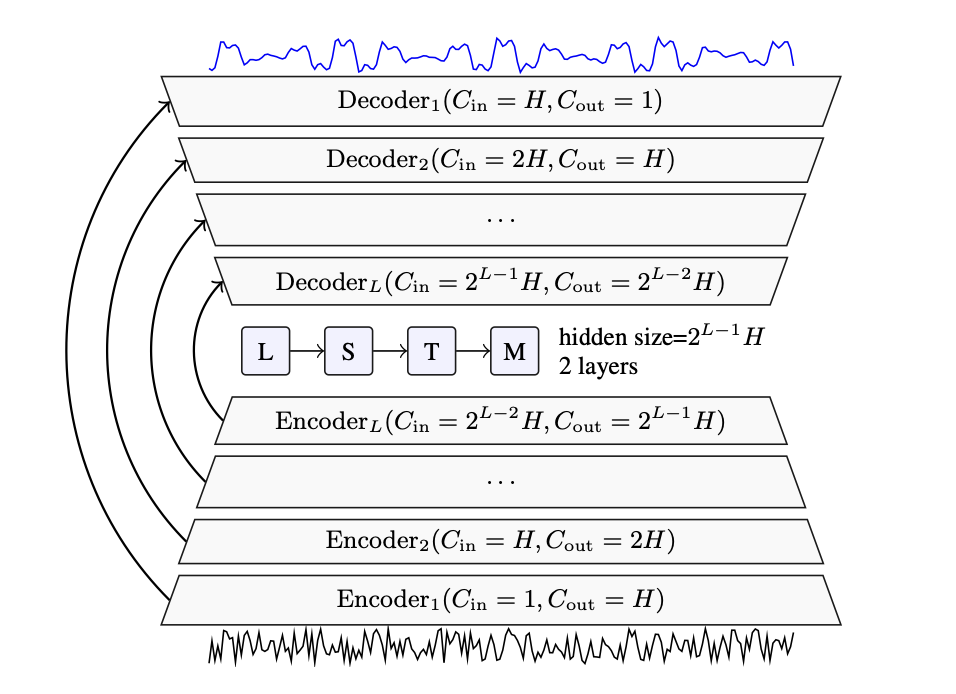

In [2]:
from IPython import display as disp
import torch
import torchaudio
from denoiser import pretrained
from denoiser.dsp import convert_audio
from scipy.signal import wiener, convolve
from scipy.special import sinc
import matplotlib.pyplot as plt
import numpy as np
import scipy
import matplotlib

In [3]:
# Downloading a test file
!wget https://facebookresearch.github.io/denoiser/audio/noisy/alex_noisy.mp3

--2024-04-21 13:54:17--  https://facebookresearch.github.io/denoiser/audio/noisy/alex_noisy.mp3
Resolving facebookresearch.github.io (facebookresearch.github.io)... 185.199.108.153, 185.199.109.153, 185.199.110.153, ...
Connecting to facebookresearch.github.io (facebookresearch.github.io)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 339840 (332K) [audio/mp3]
Saving to: ‘alex_noisy.mp3’

alex_noisy.mp3      100%[===================>] 331.88K  --.-KB/s    in 0.03s   

2024-04-21 13:54:17 (9.39 MB/s) - ‘alex_noisy.mp3’ saved [339840/339840]



In [4]:
model = pretrained.dns64()
wav, sr = torchaudio.load('alex_noisy.mp3')
wav = convert_audio(wav, sr, model.sample_rate, model.chin)
with torch.no_grad():
    causal_denoised = model(wav[None])[0]
disp.display(disp.Audio(wav.numpy(), rate=model.sample_rate))
disp.display(disp.Audio(causal_denoised.numpy(), rate=model.sample_rate))

Downloading: "https://dl.fbaipublicfiles.com/adiyoss/denoiser/dns64-a7761ff99a7d5bb6.th" to /root/.cache/torch/hub/checkpoints/dns64-a7761ff99a7d5bb6.th
100%|██████████| 128M/128M [00:03<00:00, 39.1MB/s]


In [5]:
wiener_denoised = wiener(wav.squeeze().numpy(), 7)
disp.display(disp.Audio(wav.numpy(), rate=sr))
disp.display(disp.Audio(wiener_denoised, rate=sr))

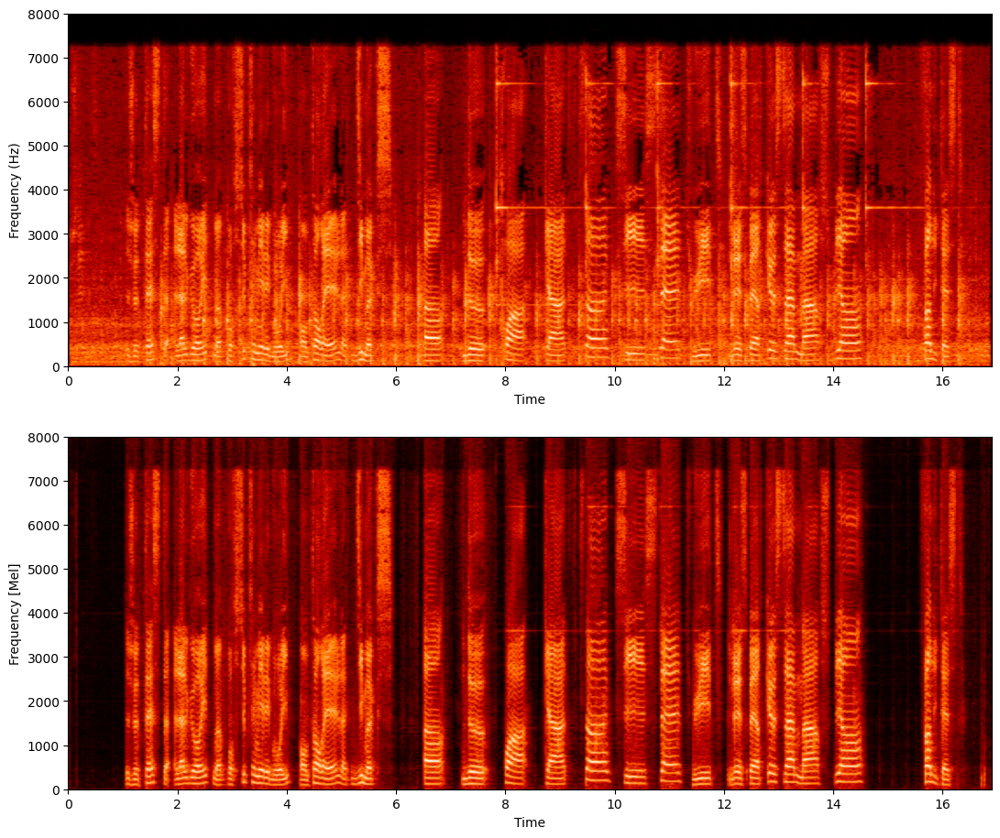

In [6]:
n_fft = 1024
window_size = n_fft
hop_size = 256
window = torch.hann_window(window_size)

def plot_specs(wav1, wav2):
    freqs1, ts1, spec1 = scipy.signal.stft(wav1, sr, nperseg=n_fft)
    freqs2, ts2, spec2 = scipy.signal.stft(wav2, sr, nperseg=n_fft)
    norm_factor = np.amax(np.abs(spec1))/np.amax(np.abs(spec2))
    spec2 = spec2 * norm_factor

    fig, (ax11,ax21) = plt.subplots(2,1,figsize=(13,11))

    ax11.pcolormesh(ts1, freqs1, np.log(np.abs(spec1) + 1e-6),  shading='gouraud', cmap=matplotlib.colormaps['gist_heat'])
    ax11.set_ylabel('Frequency (Hz)')
    ax11.set_xlabel('Time')

    im2=ax21.pcolormesh(ts2, freqs2, np.log(np.abs(spec2) + 1e-6),  shading='gouraud', cmap=matplotlib.colormaps['gist_heat'])
    ax21.set_ylabel('Frequency [Mel]')
    ax21.set_xlabel('Time')

    plt.show()

def visualize_audio(wav, sr):
    # Average all channels
    if wav.dim() == 2:
        # Any to mono audio convertion
        wav = wav.mean(dim=0)

    plt.figure(figsize=(20, 5))
    plt.plot(wav, alpha=.7, c='green')
    plt.grid()
    plt.xlabel('Time', size=20)
    plt.ylabel('Amplitude', size=20)
    plt.show()

    disp.display(disp.Audio(wav, rate=sr))

plot_specs(wav.squeeze().numpy(), causal_denoised.squeeze().numpy())

Now we will study interesting filter. It is called Sinc filter with parameter B and is defined as
    \begin{gather*}
        h(t) = 2B sinc(2Bt)
    \end{gather*}
where $sinc$ is the normalized sinc function
    \begin{gather*}
        sinc(x) = {sin(\pi t) \over \pi t}
    \end{gather*}

The interesting property is the following: it is rectangular filter in the time-frequency domain. Thus, it removes all frequencies above some level $B$:
    \begin{gather*}
        H(f) = \begin{cases}
                    0, & |f| > B\\
                    {1 \over 2}, & |f| = B\\
                    1, & |f| < B
                \end{cases}
    \end{gather*}

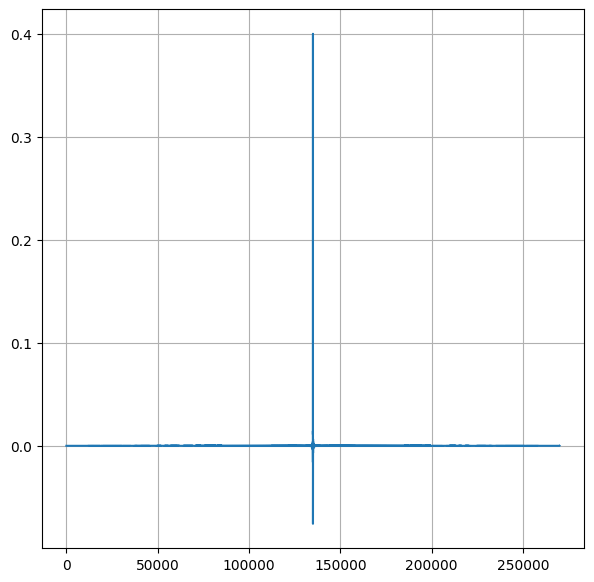

In [7]:
fc = 0.2
fc1 = 0.1
N = wav.shape[1]
sinc_filter = 2 * fc * sinc(2 * fc * (np.arange(N) - (N - 1) / 2.))
sinc_filter1 = 2 * fc1 * sinc(2 * fc1 * (np.arange(N) - (N - 1) / 2.))

plt.figure(figsize=(7, 7))
plt.plot(sinc_filter)
plt.grid(True)
plt.show()

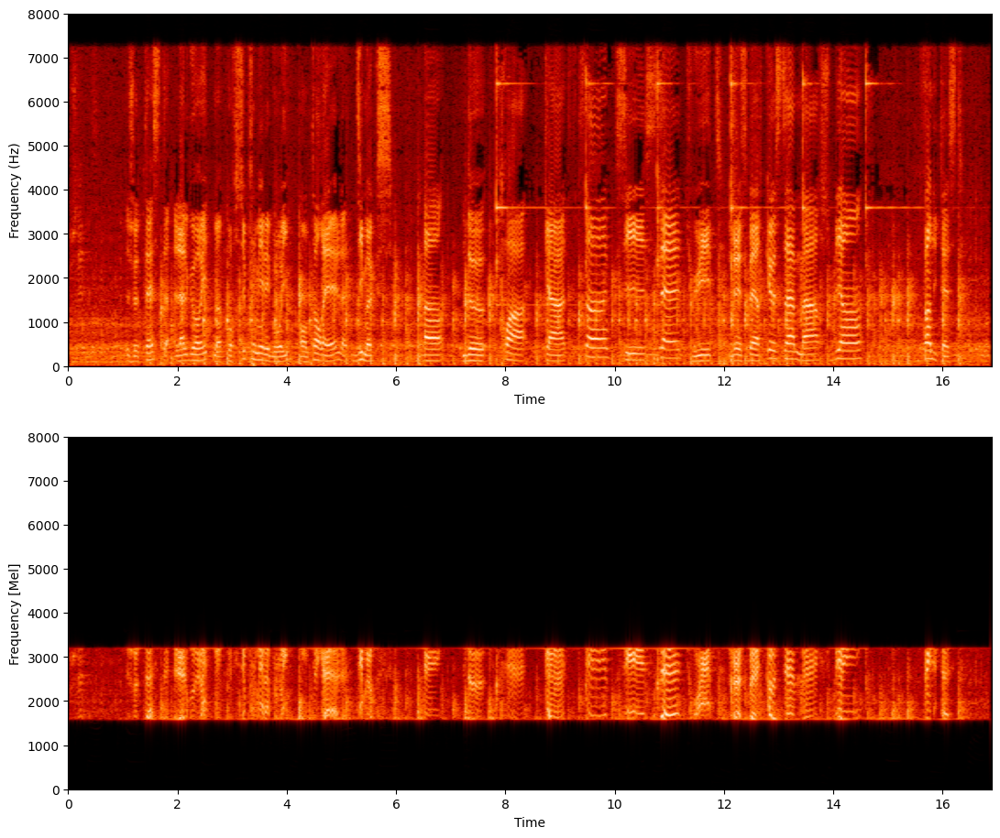

In [8]:
filtered_wav = convolve(wav.squeeze().numpy(), sinc_filter - sinc_filter1, mode="same")

plot_specs(wav.squeeze().numpy(), filtered_wav)

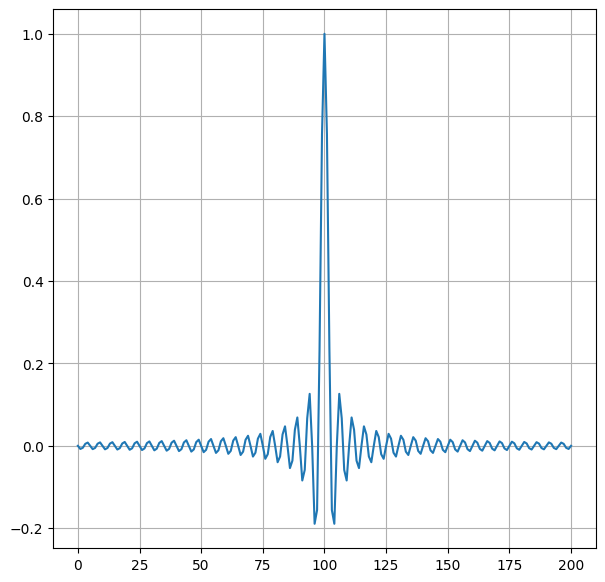

In [9]:
fc = 0.2
N = 201
sinc_filter_small = sinc(2 * fc * (np.arange(N) - (N - 1) / 2.))

plt.figure(figsize=(7, 7))
plt.plot(sinc_filter_small)
plt.grid(True)
plt.show()

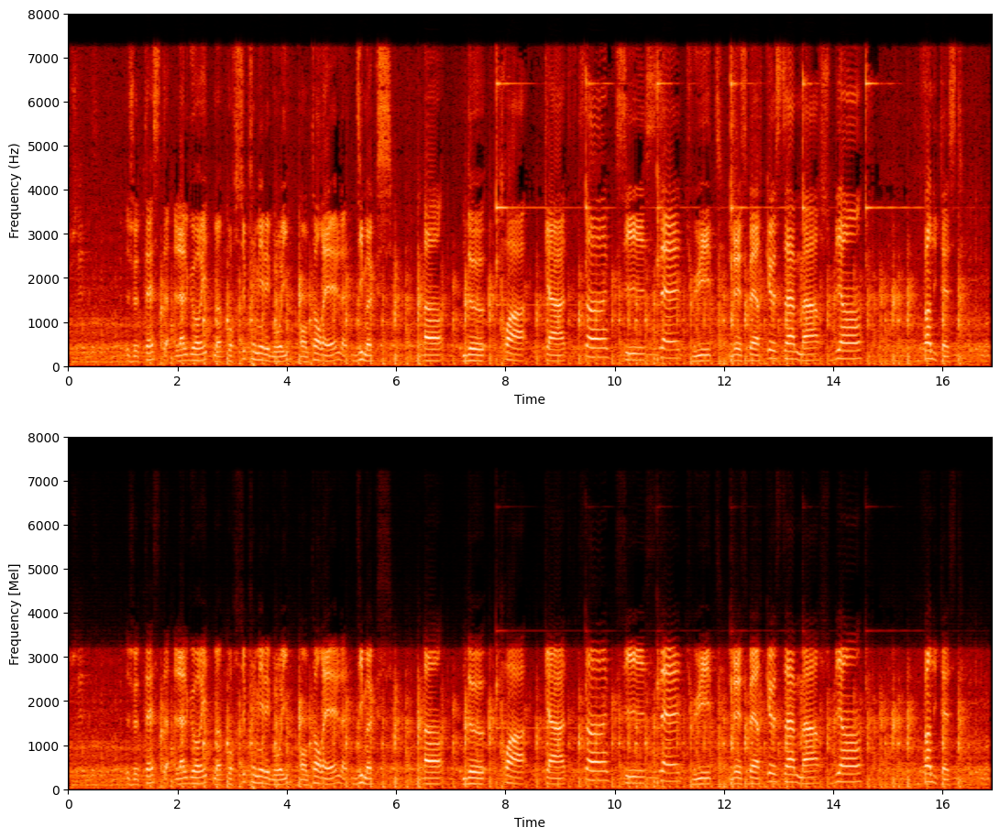

In [10]:
filtered_wav = convolve(wav.squeeze().numpy(), sinc_filter_small, mode="same")

plot_specs(wav.squeeze().numpy(), filtered_wav)

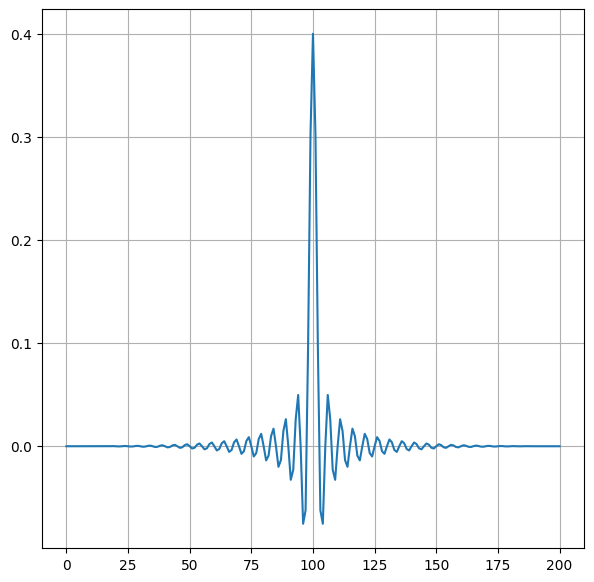

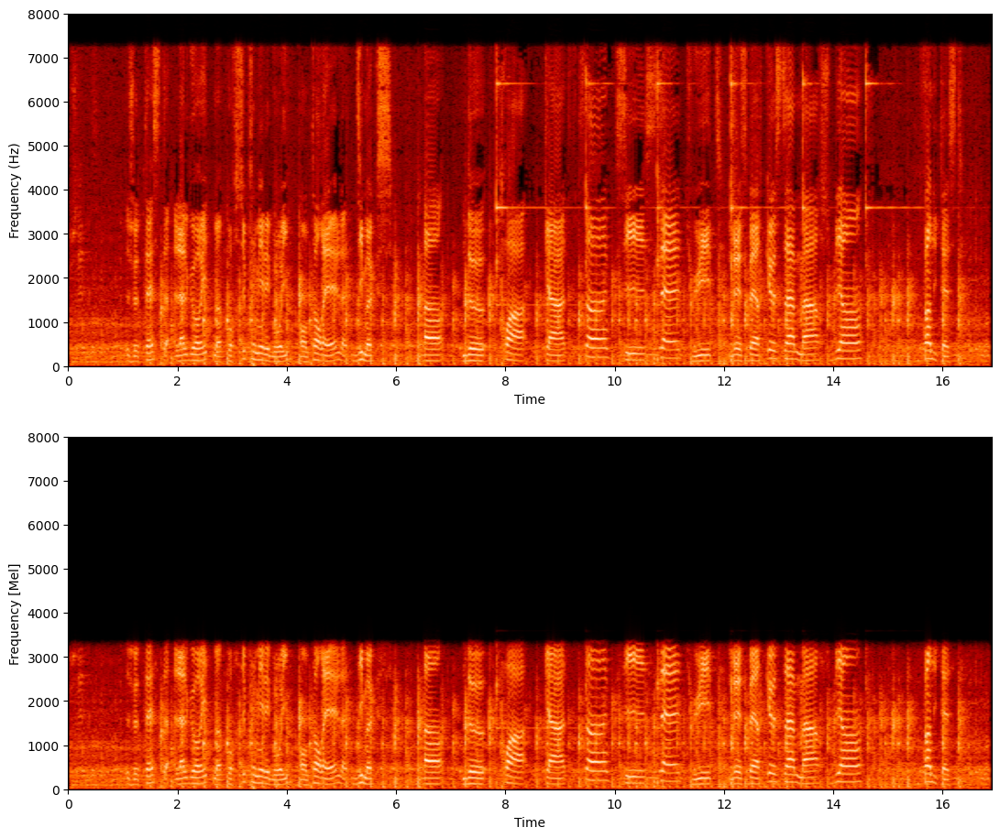

In [11]:
w = np.blackman(N)
sinc_filter_small = sinc_filter_small * w
sinc_filter_small /= sinc_filter_small.sum()

plt.figure(figsize=(7, 7))
plt.plot(sinc_filter_small)
plt.grid(True)
plt.show()

filtered_wav = convolve(wav.squeeze().numpy(), sinc_filter_small, mode="same")


plot_specs(wav.squeeze().numpy(), filtered_wav)
# plot_spec(torch.from_numpy(filtered_wav))

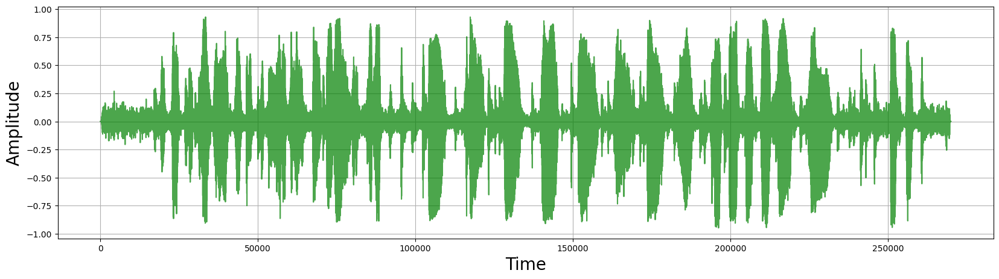

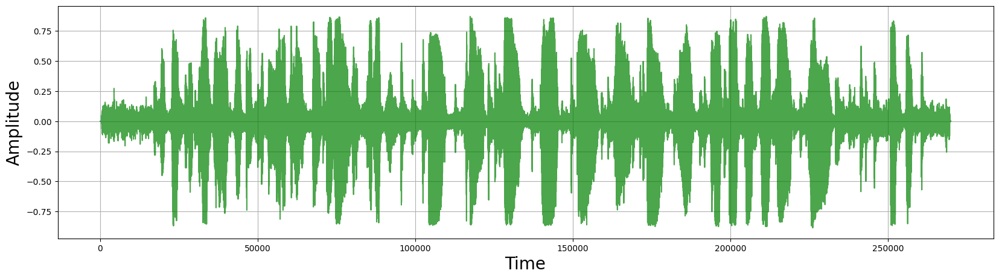

In [12]:
visualize_audio(torch.from_numpy(filtered_wav), sr)
visualize_audio(wav, sr)

In [13]:
model_nc = pretrained.valentini_nc()

with torch.no_grad():
    nc_denoised = model_nc(wav[None])[0]
disp.display(disp.Audio(wav.numpy(), rate=model.sample_rate))
disp.display(disp.Audio(nc_denoised.numpy(), rate=model.sample_rate))

Downloading: "https://dl.fbaipublicfiles.com/adiyoss/denoiser/valentini_nc-93fc4337.th" to /root/.cache/torch/hub/checkpoints/valentini_nc-93fc4337.th
100%|██████████| 232M/232M [00:04<00:00, 51.6MB/s]


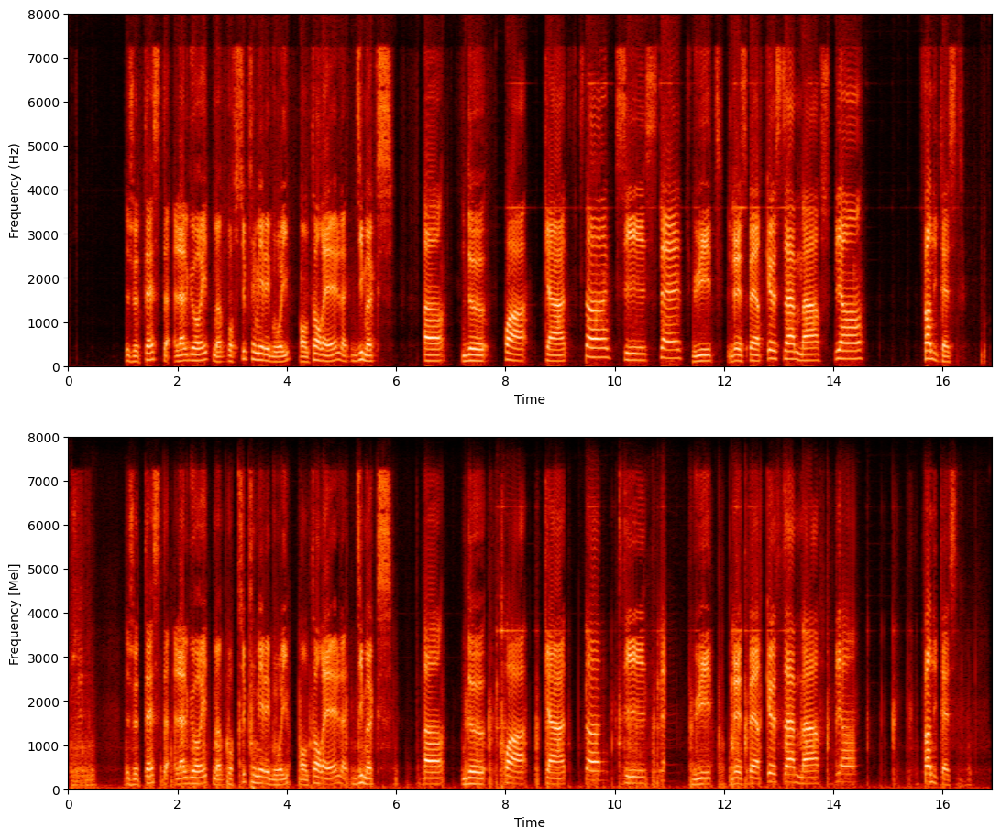

In [14]:
plot_specs(causal_denoised.squeeze().numpy(), nc_denoised.squeeze().numpy())

In [15]:
frame_size = 16 * 40 # 40ms
n_chunks = wav.shape[1] // frame_size

chunked_wav = torch.stack(torch.chunk(wav.squeeze(), n_chunks)[:-1], dim=0)

with torch.no_grad():
    nc_denoised_chunked = model_nc(chunked_wav)
    causal_denoised_chunked = model(chunked_wav)
disp.display(disp.Audio(causal_denoised_chunked.reshape(-1).numpy(), rate=model.sample_rate))
disp.display(disp.Audio(nc_denoised_chunked.reshape(-1).numpy(), rate=model.sample_rate))

<ipython-input-16-3820ac84eab7>:11: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  chunks = torch.from_numpy(librosa.util.frame(wav_padded, frame_length=chunk_size, hop_length=stride)).permute(1, 0)


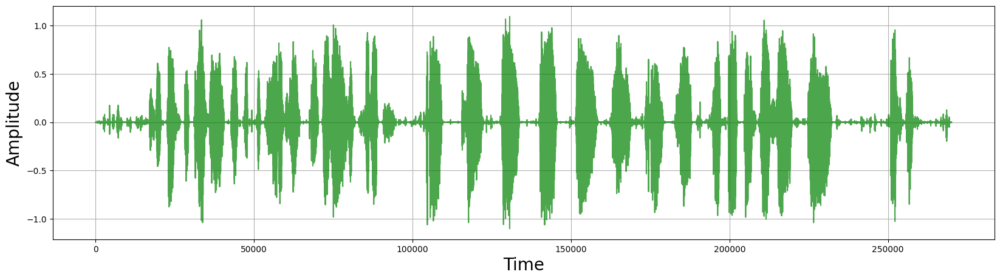

In [16]:
import librosa

def overlap_add(model, wav: np.ndarray, chunk_size):
    stride = chunk_size // 2
    n = len(wav) - chunk_size
    n_chunks = n // stride + 1 + (n % stride > 0)
    n_pad = stride - n % stride

    wav_padded = np.pad(wav, (0, n_pad), 'constant', constant_values=(0, 1e-5))

    chunks = torch.from_numpy(librosa.util.frame(wav_padded, frame_length=chunk_size, hop_length=stride)).permute(1, 0)

    with torch.no_grad():
        chunks = model(chunks)[:, 0, :]

    n_chunks = chunks.shape[0]
    first = chunks[0, 0:stride]
    last = chunks[-1, stride:]

    overlapped_chunks = chunks.reshape(-1)[stride:chunk_size * (n_chunks - 1) + stride].reshape(-1, chunk_size)
    window_vec = torch.sin(torch.arange(stride) / (stride - 1)) * (np.pi / 2)
    kernel_matrix = torch.zeros(2*stride, stride, dtype=overlapped_chunks.dtype)
    kernel_matrix[:stride, :] = torch.diag(1 - window_vec)
    kernel_matrix[stride:, :] = torch.diag(window_vec)
    sum_overlapped_chunks = (overlapped_chunks @ kernel_matrix).reshape(-1)

    overlap_added_wav = torch.cat((first, sum_overlapped_chunks, last), dim=-1)
    return overlap_added_wav

overadd_wav = overlap_add(model, wav.squeeze().numpy(), chunk_size=650)
visualize_audio(overadd_wav, sr)

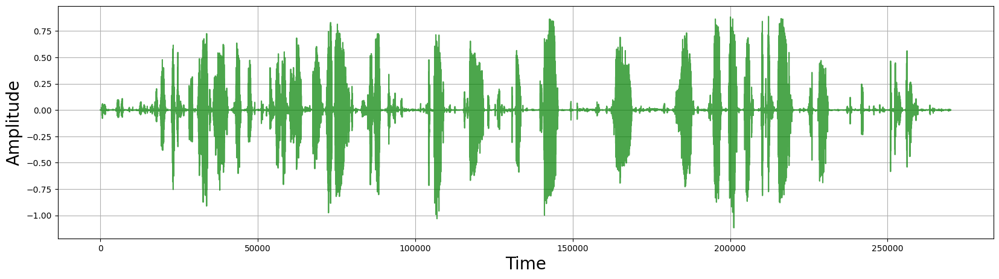

In [17]:
overadd_wav = overlap_add(model_nc, wav.squeeze().numpy(), chunk_size=650)
visualize_audio(overadd_wav, sr)

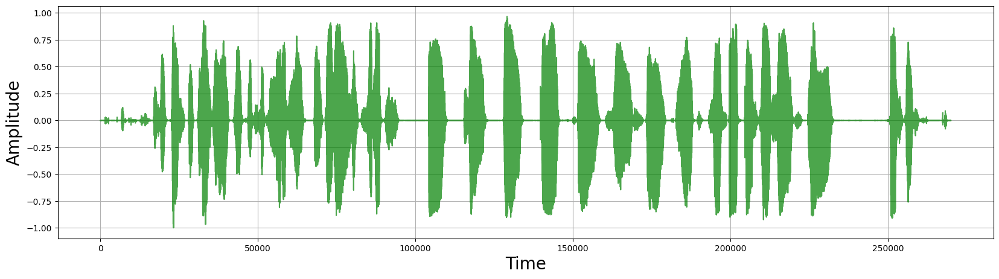

In [18]:
from denoiser.demucs import DemucsStreamer

streamer = DemucsStreamer(model)
with torch.no_grad():
    estimate = torch.cat([
        streamer.feed(wav),
        streamer.flush()], dim=1)[None]

visualize_audio(estimate.squeeze(), sr)

In original demucs implementation there are 3 main techniques to enhance quality on evaluation of real-time model:
- Normalize audio with variance estimated during evaluation;

- Padding with history before upsampling and downsampling;

- Return extra strides from model inference.

In [19]:
import math
from denoiser.resample import upsample2, downsample2

def demucs_process(model, wav):
    streamer = DemucsStreamer(model)
    resample_buffer = streamer.resample_buffer
    stride = streamer.stride
    resample = model.resample
    n_frames = 0
    total_variance = 0

    resample_in = torch.zeros(1, resample_buffer)
    resample_out = torch.zeros(1, resample_buffer)

    stream = wav
    outs = []
    while stream.shape[1] >= streamer.total_length:
        n_frames += 1
        frame = stream[:, :streamer.total_length]
        if model.normalize:
            mono = frame.mean(0)
            variance = (mono**2).mean()
            total_variance = variance / n_frames + (1 - 1 / n_frames) * total_variance # update variance
            frame = frame / (model.floor + math.sqrt(total_variance)) # norm audio by variance
        padded_frame = torch.cat([resample_in, frame], dim=-1)
        resample_in[:] = frame[:, stride - resample_buffer:stride]
        frame = padded_frame

        if resample == 4:
            frame = upsample2(upsample2(frame))
        elif resample == 2:
            frame = upsample2(frame)
        frame = frame[:, resample * resample_buffer:]  # remove pre sampling buffer
        frame = frame[:, :resample * streamer.frame_length]  # remove extra samples after window

        out, extra = streamer._separate_frame(frame)
        padded_out = torch.cat([resample_out, out, extra], 1)
        resample_out[:] = out[:, -resample_buffer:]
        if resample == 4:
            out = downsample2(downsample2(padded_out))
        elif resample == 2:
            out = downsample2(padded_out)
        else:
            out = padded_out

        out = out[:, resample_buffer // resample:]
        out = out[:, :stride]

        if model.normalize:
            out *= math.sqrt(total_variance)

        outs.append(out)
        stream = stream[:, stride:]

    out = torch.cat(outs, 1)

    return out

In [20]:
with torch.no_grad():
    estimate = demucs_process(model, wav)

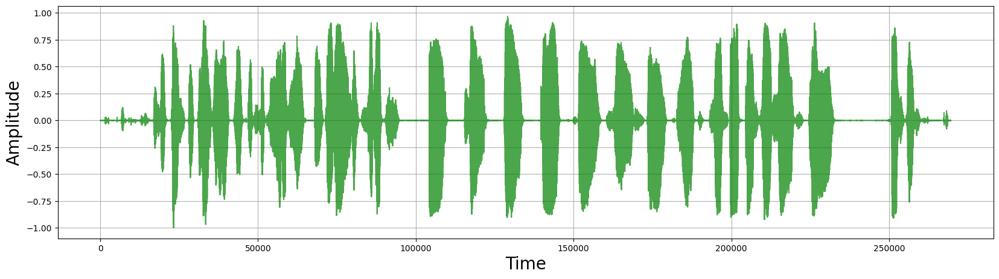

In [21]:
visualize_audio(estimate.squeeze(), sr)